# <font color='blue'>Project 4: Advanced Lane Finding </font>
<div class= "alert alert-block alert-info"> *Build a pipline using distortion correction, image rectification, color transforms, and gradient thresholding to identity lane lines and their curvature in a video.*</div>

**Note**:The outputs are expected better in the #1 project Finding Lane Lines at identifing curves 

## Outline

<font color='blue'>The pipline dectection in ONE FRAME:</font>

1. **Camera Calibration & Distortion Correction**:
    -  Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.<br>
    -  Apply a distortion correction to raw images.
1. **Perspective transformation**:
    -  Apply a perspective transform to rectify binary image ("birds-eye view").
1. **Gradient and Color Thresholds**:
    -  Use color transforms, gradients, etc., to create a thresholded binary image.
1. **Fitting boundary lines**:
    -  Detect lane pixels and fit to find the lane boundary.
1. **Approximate road properties and vehicle position**:
    -  Determine the curvature of the lane and vehicle position with respect to center.<br>
    -  Warp the detected lane boundaries back onto the original image.<br>
    -  Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.<br>


<font color='blue'>The pipline dectection in MULTI-FRAME(VIDEO):</font>
1. **Smoothing**:
    -  Take over the last n fames of video to obtain a cleaner result.
    -  Append a new high-confidence measurement to the list of recent measurements.
    -  Take an average over n past measurements to obtain lane position.
1. **Sanity check**:
1. **Look-Ahead Filter**:
1. **Reset**:

In [1]:
***
<font color='gray'>Image result (one frame):</font>
![this is image](docs/title.png)

SyntaxError: invalid syntax (<ipython-input-1-764541edb2bb>, line 1)

## Result
#### Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!).

 [link to my video result](https://www.youtube.com/watch?v=blezjtz1lWU)

***

## Discussion

#### Briefly discuss any problems / issues you faced in your implementation of this project.  Where will your pipeline likely fail?  What could you do to make it more robust?

I tried to make pipline in some videos outside the project and here is my experiences and improvements:

1. Setting up: Camera Calibration and parameters tuning such as colour thresholds to refine the results are burdensome tasks.<br> 
>  In my research there is no such Auto-Calibration, Auto-transform except 'automatic Canny edge detection' available on Internet at this time.
1. Processing: Our code may work well in very limited visibility conditions such as clear view, no road markings (like crosswalk)but apaptting them to other videos at different places may occur very unexpected noises.<br> 
>  

***

## Project Content

In [1]:
# Import some usefull packages 

import cv2
import numpy as np
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip

# A result shower function to display result processed at each step.
# Input : test image's link to process and processed action. 
# Output: Original image(s) and processed image(s).

def display_result(dir, action, action_title, fig_w, fig_h):
    
    files_infolder = glob.glob(dir)
    # set up size result to show: 2 columns and one image and its action at each row
    fig,ax = plt.subplots(nrows = len(files_infolder), ncols = 2, figsize=(fig_w,fig_h))  
    fig.tight_layout()
    
    i =0
    for img in files_infolder:
        
        image = mpimg.imread(img)       
        ax[i,0].set_title('Original Image', fontsize=30)
        ax[i,0].imshow(image)
        ax[i,1].set_title(action_title, fontsize=30)
        ax[i,1].imshow(action(image))
        i = i+1
        
    plt.show()
    return

### 1. Camera Calibration & Distortion Correction

>  - Camera calibration
>      - Input: provided chessboard images, chessboard size : 9x6
>      - Output: distortion coefficients(dist), camera matrix(mtx), camera position(rvecs,tvecs)
>  - Distortion correction
>      - Input: distorted image(img), camera matrix(mtx), distortion coef(dist)
>      - Output: undistored image

In [2]:
import pickle
%matplotlib inline

class Undistortion:
    def __init__(self, image_direction, chessboard_nx, chessboard_ny):
        self.image_direction = image_direction
        self.chessboard_nx = chessboard_nx
        self.chessboard_ny = chessboard_ny
        self.mtx = None
        self.dist = None
        
    def camera_calibration(self):
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((self.chessboard_nx*self.chessboard_ny,3), np.float32)
        objp[:,:2] = np.mgrid[0:self.chessboard_ny, 0:self.chessboard_nx].T.reshape(-1,2)
        
        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.
        
        # Make a list of calibration images
        images = glob.glob(self.image_direction)
        
        # Get one of those images shape
        image = cv2.imread(images[1])
        image_size = (image.shape[1], image.shape[0])
        
        # Step through the list and search for chessboard corners
        for idx, fname in enumerate(images):
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            
            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (self.chessboard_ny,self.chessboard_nx), None)
            
            # If found, add object points, image points
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)
                # Draw and display the corners
                cv2.drawChessboardCorners(img, (self.chessboard_ny,self.chessboard_nx), corners, ret)
                plt.figure()
                plt.imshow(img)
                plt.show()
        # Do camera calibration given object points and image points
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size,None,None)
        self.mtx = mtx
        self.dist = dist
        
    
    def save_data(self):
        # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
        dist_pickle = {}
        dist_pickle["mtx"] = self.mtx
        dist_pickle["dist"] = self.dist
        pickle.dump( dist_pickle, open( "camera_cal/cal_dist_pickle.p", "wb" ) )
        
    
    def get_data(self):
        # Load camera calibration result
        with open("camera_cal/cal_dist_pickle.p", "rb") as f:
            dist_pickle = pickle.load(f)
            
        self.mtx = dist_pickle['mtx']
        self.dist = dist_pickle['dist']
    
    def undistorted_image(self, img):
        undist = cv2.undistort(img, self.mtx, self.dist, None, self.mtx)
        return undist
        

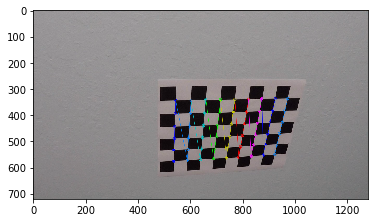

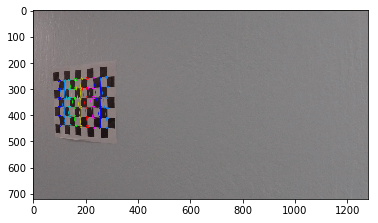

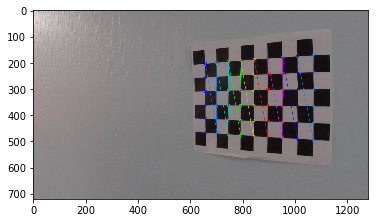

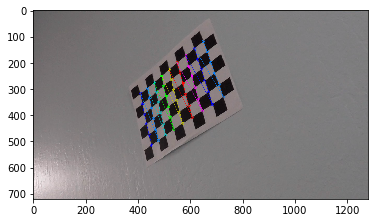

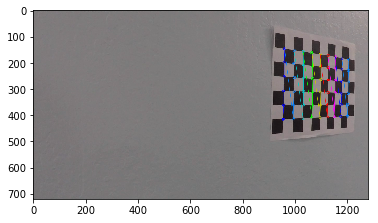

...

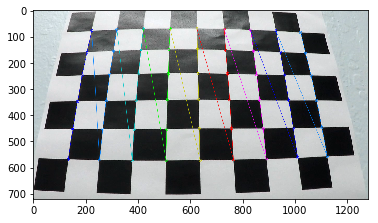

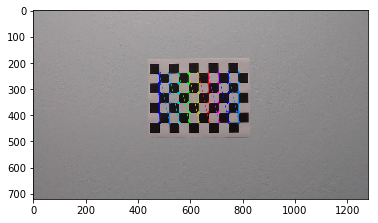

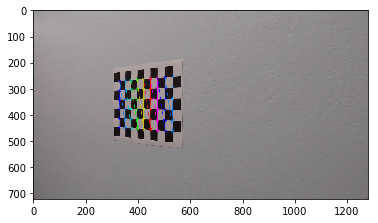

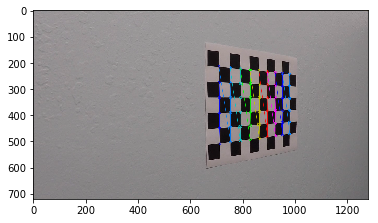

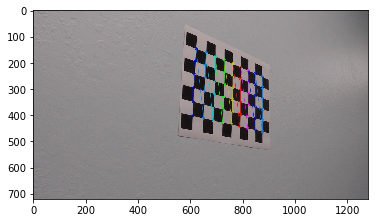

In [3]:
undistored_camera = Undistortion('camera_cal/calibration*.jpg',9,6)
undistored_camera.camera_calibration()

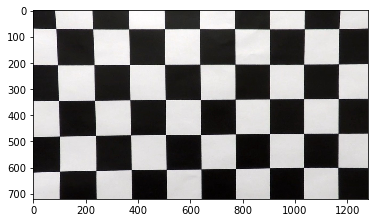

In [4]:
# Sample of undistorted chessboard image
test_img = undistored_camera.undistorted_image(mpimg.imread('camera_cal/calibration1.jpg'))
plt.imshow(test_img)
plt.show()

In [5]:
# Sample of undistorted image
#display_result('test_images/straight*.jpg',undistored_camera.undistorted_image, "Undistorted", 20, 15)

### 2. Perspective Transform

>  Identify four source points for perspective transform. In this case, assume that the road is a flat plane. This isn't strictly true, but it can serve as an approximation for this project. Pick four points in a trapezoidal shape (similar to region masking) that would represent a rectangle when looking down on the road from above.<br>
>  The easiest way to do this is to investigate an image where the lane lines are straight, and find four points lying along the lines that, after perspective transform, make the lines look straight and vertical from a bird's eye view perspective.

In [6]:
# Interactive window to pick up source points

%matplotlib notebook
%matplotlib notebook 

class Transform():
    def __init__(self):
        self.src = None
        self.dst = None
        
    def save_data(self, img, coords):
        plt.imshow(img)
        for i in range (0, len(coords)):
            plt.plot(coords[i][0], coords[i][1],".",markersize=30)
            
        bottom_left = [coords[0][0], coords[0][1]]
        top_left = [coords[1][0], coords[1][1]]
        top_right = [coords[2][0], coords[2][1]]
        bottom_right = [coords[3][0], coords[3][1]]
        
        #Grab the image shape
        img_size = (img.shape[1], img.shape[0])
        
        # For source points, src = np.float32([[,],[,],[,],[,]])
        self.src = np.float32([bottom_left, top_left, top_right,bottom_right])
        # For destination points, choose to be nice fit for displaying
        # dst = np.float32([[,],[,],[,],[,]]), (must be listed in the same order as src points!)
        offset = 80 # offset for dst points
        self.dst = np.float32([[offset, img_size[1]-offset],[offset,offset],\
                          [img_size[0]-offset,offset],[img_size[0]-offset, img_size[1]-offset]])
        
        dist_pickle = {}
        dist_pickle["src"] = self.src
        dist_pickle["dst"] = self.dst
        pickle.dump( dist_pickle, open( "camera_cal/transform_pickle.p", "wb" ) )
    
    def get_data(self):
        # Load camera calibration result
        with open("camera_cal/transform_pickle.p", "rb") as f:
            dist_pickle = pickle.load(f)
            
        self.src = dist_pickle['src']
        self.dst = dist_pickle['dst']
        
    def perspective_transform(self, img):
        #Grab the image shape
        img_size = (img.shape[1], img.shape[0])
        
        if self.src is None and self.dst is None:
            self.get_data()
        # Given src and dst points, calculate the perspective transform matrix
        transform_matrix = cv2.getPerspectiveTransform(self.src, self.dst)
        # Warp the image using OpenCV warpPerspective() to a top-down view
        warped_image = cv2.warpPerspective(img,transform_matrix, img_size)
        
        return warped_image
    

<IPython.core.display.Javascript object>


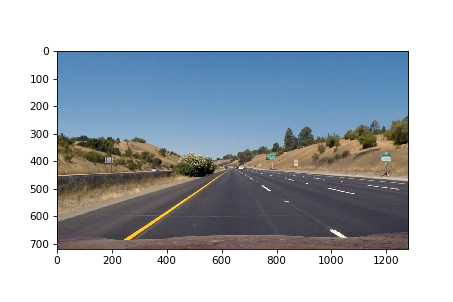

In [7]:
# Interactive window to pick up source points

%matplotlib notebook
%matplotlib notebook 
# open in different window
#%matplotlib qt 
img = plt.imread('./test_images/straight_lines1.jpg')
implot = plt.imshow(img)

coords = []
def onclick(event):
    if event.xdata != None and event.ydata != None:
        global coords
        if len(coords) <= 3:
            coords.append((int(event.xdata), int(event.ydata)))
        else:
            fig.canvas.mpl_disconnect(cid)
            plt.clf()

cid = implot.figure.canvas.mpl_connect('button_press_event', onclick)
plt.show()

In [8]:
transformed_image = Transform()
if coords:
    transformed_image.save_data(img, coords)
else: transformed_image.get_data()

In [9]:
%matplotlib inline
#display_result('test_images/test*.jpg', transformed_image.perspective_transform, "perspective_transform",10, 30)

### 3. Gradient and Color Thresholds

>  *Try out various combinations of color and gradient thresholds to generate a binary image where the lane lines are clearly visible*

#### Gradient Thresholding

In [10]:
def abs_sobel_thresh(img, orient='x',sobel_kernel=3, abs_thresh=(0,255)):
    
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobelx[sobelx > 0] = 0
        abs_sobel = np.absolute(sobelx)
    if orient == 'y':
        sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        sobely[sobely > 0] = 0
        abs_sobel = np.absolute(sobely)
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= abs_thresh[0]) & (scaled_sobel <= abs_thresh[1])] = 1

    # Return the result
    return binary_output
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    sobelx[sobelx > 0], sobely[sobely > 0]= 0, 0
    # Calculate the gradient magnitude
    gradmag = np.hypot(sobelx, sobely) #gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output
def dir_threshold(img, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    sobelx[sobelx > 0], sobely[sobely > 0]= 0, 0
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1

    # Return the binary image
    return binary_output
def sobel_thres(image,thres =(20,100) ,more_gradient = False):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=27, abs_thresh= thres)
    
    if more_gradient:
        grady = abs_sobel_thresh(image, orient='y', sobel_kernel=27, abs_thresh=(40, 255))
        mag_binary = mag_thresh(image, sobel_kernel=27, mag_thresh=(40, 255))
        dir_binary = dir_threshold(image, sobel_kernel=27, dir_thresh=(0.3, 1.4))
        # Combine all of them
        combined = np.zeros_like(dir_binary)
        combined[(gradx == 1)| (grady == 1) & ((mag_binary == 1) & (dir_binary == 1))] = 1
        
        return combined
    else:
        return gradx

def gradient_threshold(img, thres_method = "Sobel"):
    if thres_method == "Sobel":
        # Note: img is the undistorted image
        # Reduce some noises #cv2.GaussianBlur(img,(5,5),0), cv2.bilateralFilter(img,9,75,75)
        img = cv2.medianBlur(img,5)
        l_channel = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)[:,:,0]
        y_channel = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)[:,:,0]
        white  = cv2.addWeighted(l_channel, 0.5, y_channel, 0.5, 0)
        yellow = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)[:,:,2]
        
        white_threshold  = sobel_thres(white  ,thres =(30,255), more_gradient = False)
        yellow_threshold = sobel_thres(yellow  ,thres =(30,255), more_gradient = False)
        
        combined_binary = np.zeros_like(yellow)
        combined_binary[(yellow_threshold ==1)|(white_threshold ==1)] = 1
         
    if thres_method == "Laplacian":
        # Noise remover :cv2.GaussianBlur(img,(5,5),0), cv2.medianBlur(img,5)
        #img_filter = cv2.medianBlur(img,5)
        img_filter = cv2.bilateralFilter(img,9,75,75)
        """LUV COLOR SPACE"""
        l_channel_LUV = cv2.cvtColor(img_filter, cv2.COLOR_RGB2LUV)[:,:,0] #white lines
        """LAB COLOR SPACE"""
        b_channel_Lab = cv2.cvtColor(img_filter, cv2.COLOR_RGB2Lab)[:,:,2]# yellow lines
        
        #Output dtype = cv2.CV_64F.  Then take its absolute and convert to cv2.CV_8U
        laplacian_yellow = np.absolute(cv2.Laplacian(b_channel_Lab, cv2.CV_64F, ksize = 31))
        yellow = np.uint8(255*laplacian_yellow/np.max(laplacian_yellow))
        yellow_binary = np.zeros_like(yellow)
        yellow_binary[(yellow >= 40) & (yellow <=100 )] = 1
        
        laplacian_white  = np.absolute(cv2.Laplacian(l_channel_LUV, cv2.CV_64F, ksize=  31))
        white = np.uint8(255*laplacian_white/np.max(laplacian_white))
        white_binary = np.zeros_like(white)
        white_binary[(white >= 50) & (white <=100 )] = 1
        
        combined_binary = np.zeros_like(b_channel_Lab)
        combined_binary[(yellow_binary ==1)|(white_binary ==1)] = 1
                                      
    return combined_binary


In [11]:
#display_result('test_images/test*.jpg', gradient_threshold, "gradient_threshold", 10, 30)

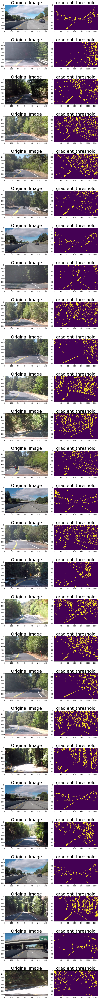

In [12]:
display_result('test_images/challenges/*.jpg', gradient_threshold, "gradient_threshold", 10, 100)

In [13]:
def color_threshold(img, color_space = "LUV_LAB"):
    
    # Reduce some noises
    img = cv2.GaussianBlur(img,(5,5),0)# Note: img is the undistorted image
    
    if color_space == "HSL_HSV": 
        """HLS COLOR SPACE"""
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        #get white lines, "l" stands for luminosity or lightness 
        l_channel_HLS, s_channel_HLS =  hls[:,:,1], hls[:,:,2]
        ls_channel_HLS = s_channel_HLS*0.2 + l_channel_HLS*0.8
        # Threshold color S, L channel: white lanes and shadows
        ls_binary_HLS = np.zeros_like(ls_channel_HLS)
        ls_binary_HLS[(ls_channel_HLS >= 170) & (ls_channel_HLS <= 255)] = 1
        
        """HSV COLOR SPACE"""
        hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        # s channel get yellows lines, v channel get yellow lines and white lines
        s_channel_HSV, v_channel_HSV =  hsv[:,:,1], hsv[:,:,2]
        sv_channel_HSV = s_channel_HSV*0.7 + v_channel_HSV*0.3 # get yellow lines
        # Threshold color S, V channel
        sv_binary_HSV = np.zeros_like(sv_channel_HSV)
        sv_binary_HSV[(sv_channel_HSV >= 120) & (sv_channel_HSV <= 255)] = 1
        
        """COMBINE COLOR SPACE"""
        color_threshold = np.zeros_like(sv_binary_HSV)
        color_threshold[(ls_binary_HLS == 1)|(sv_binary_HSV == 1)] = 1
    
    if color_space == "LUV_LAB":
        l_channel = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)[:,:,0]
        b_channel = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)[:,:,2] 
        # white lines
        l_binary = np.zeros_like(l_channel)
        l_binary[(l_channel >= 210) & (l_channel <= 255)] = 1
        #yellow lines
        b_binary = np.zeros_like(b_channel)
        b_binary[(b_channel >= 150) & (b_channel <=255)] = 1
        
        """COMBINE COLOR SPACE"""
        color_threshold = np.zeros_like(b_binary)
        color_threshold[(l_binary == 1)|(b_binary == 1)] = 1
        
    if color_space == "YUV":
        u_channel = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)[:,:,1]
        y_channel = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)[:,:,0]
        # white lines
        y_binary = np.zeros_like(y_channel)
        y_binary[(y_channel >= 200) & (y_channel <= 255)] = 1
        #yellow lines
        u_binary = np.zeros_like(u_channel)
        u_binary[(u_channel >= 150) & (u_channel <= 255)] = 1
        
        """COMBINE COLOR SPACE"""
        color_threshold = np.zeros_like(u_binary)
        color_threshold[(y_binary == 1) | (u_binary == 1)] = 1
        
    return color_threshold

In [14]:
#display_result('test_images/test*.jpg', color_threshold, "color_threshold", 10, 30)

In [15]:
#display_result('test_images/challenges/*.jpg', color_threshold, "color_threshold", 10, 70)

In [16]:
def color_gradient(img, combine = False):
    
    gradient = gradient_threshold(img)
    color = color_threshold(img)
    if combine == True:
        # Combine the two binary thresholds
        combined_binary = np.zeros_like(color)
        combined_binary[(gradient == 1) | (color == 1) ] = 1
        return combined_binary
    else:
        return gradient

In [17]:
#display_result('test_images/test*.jpg', color_gradient, "color_gradient", 10, 30)

In [18]:
#display_result('test_images/challenges/*.jpg', color_gradient, "color_gradient", 10, 70)

***

In [19]:
def process_each_image(img):
    
    distortion_correc = undistored_camera.undistorted_image(img)
    thresholding      = color_gradient(distortion_correc)
    perspective_trans = transformed_image.perspective_transform(thresholding)
    
    return perspective_trans

In [20]:
#display_result('test_images/test*.jpg', process_each_image, "process_each_image", 10, 30)

In [21]:
#display_result('test_images/challenges/*.jpg', process_each_image, "process_each_image", 10, 70)

### 4. Fitting boundary lines

In [22]:
# peaks in a Histogram
def histogram_sldwindows(binary_warped, viz = False):
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    """STARTING POINT FINDING OPTIMIZATION """
      # Assuming we created a warped binary image called "binary_warped"
      # Take a histogram of the bottom part of the image, its size changed as below.
      # Find the peak of the left and right halves of the histogram would be possible starting point
      # Note: The smaller size chosen, the more exact starting point could be chosen for solid lines.
      # On the other hand, it would be noise for dash lines. 
      
    left_pos, right_pos = [],[] #starting point position 
    for i in reversed(range(2,6)):
        histogram = np.sum(binary_warped[binary_warped.shape[0]- binary_warped.shape[0]//i:,:], axis=0)
        midpoint = np.int(histogram.shape[0]/2)
        left_pos.append(np.argmax(histogram[:midpoint]))
        right_pos.append(np.argmax(histogram[midpoint:])+ midpoint)
    leftx_base  = min(left_pos)
    rightx_base = max(right_pos)
    # lines in the right side would be dash lines, noises...So, do sanity check here
    # to make sure its preciseness.
    i = 0
    while rightx_base - leftx_base > 900 or rightx_base -leftx_base < 700:
        i +=1
        if len(right_pos[i:]) > 0:
            right_pos.sort()
            rightx_base = min(right_pos[i:])
        else: break
    """STARTING POINT FINDING OPTIMIZATION END"""
    
    # Choose the number of sliding windows
    nwindows = 12
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy, nonzerox = np.array(nonzero[0]), np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current, rightx_current = leftx_base, rightx_base
    good_distance = rightx_current - leftx_current
    
    margin = 100 # Set the width of the windows +/- margin
    minpix = 50 # Set minimum number of pixels found to recenter window
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds, right_lane_inds = [], []
    left_recenter, right_recenter = False, False
    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low  = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low   = leftx_current  - margin
        win_xleft_high  = leftx_current  + margin
        win_xright_low  = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        if viz == True:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 10) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 10)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds  = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & \
                           (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &\
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]  
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            if left_recenter == True:
                dst1 = np.int(np.mean(nonzerox[good_left_inds])) - leftx_current
                leftx_current = np.int(np.mean(nonzerox[good_left_inds])) + dst1
            else: leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            if right_recenter == True:
                dst2 = np.int(np.mean(nonzerox[good_right_inds])) - rightx_current
                rightx_current = np.int(np.mean(nonzerox[good_right_inds])) + dst2
            else: rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
        if len(good_left_inds) > minpix and len(good_right_inds) > minpix :
            if rightx_current - leftx_current > good_distance:
                rightx_current = leftx_current + good_distance
            else: good_distance = rightx_current - leftx_current
                
        left_recenter, right_recenter = True, True

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx, lefty   = nonzerox[left_lane_inds], nonzeroy[left_lane_inds]
    rightx, righty = nonzerox[right_lane_inds], nonzeroy[right_lane_inds]
    
    # "expected non-empty vector for x" error
    if (np.sum(leftx) !=0) & (np.sum(rightx) !=0):
        non_empty = True
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        non_empty = False
        left_fit,right_fit  = (0,0,0), (0,0,0)
    
    if viz == True:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 255, 255]
    
    if viz == True:
        return leftx, lefty, rightx, righty, left_fit, right_fit, non_empty, out_img
    else:  
        return leftx, lefty, rightx, righty, left_fit, right_fit, non_empty 

In [23]:
def fit_line(img):
    
    distortion_correc = undistored_camera.undistorted_image(img)
    thresholding      = color_gradient(distortion_correc)
    perspective_trans = transformed_image.perspective_transform(thresholding)
    _, _, _, _, _, _, _,out = histogram_sldwindows(perspective_trans, viz = True)
    
    return out

In [24]:
#display_result('test_images/test*.jpg', fit_line, "fit_line", 10, 30)

In [25]:
#display_result('test_images/challenges/*.jpg', fit_line, "fit_line", 10, 70)

In [26]:
def quickfind_lines(binary_warped,left_fit, right_fit):
    
    # Assume we have a new warped binary image in next frame of video
    # left_fit, right_fit are output from histogram_sldwindows function
    
    nonzero = binary_warped.nonzero()
    Y, X = np.array(nonzero[0]), np.array(nonzero[1])  #nonzeroy, nonzerox
    Y_max = binary_warped.shape[0]
    margin = 100
    
    left_lane_inds  = ((X > (left_fit[0]*(Y**2)  + left_fit[1]*Y  + left_fit[2]  - (1+(Y_max-Y)/Y_max)*margin)) &\
                      ( X < (left_fit[0]*(Y**2)  + left_fit[1]*Y  + left_fit[2]  + (1+(Y_max-Y)/Y_max)*margin))) 
    right_lane_inds = ((X > (right_fit[0]*(Y**2) + right_fit[1]*Y + right_fit[2] - (1+(Y_max-Y)/Y_max)*margin)) &\
                      ( X < (right_fit[0]*(Y**2) + right_fit[1]*Y + right_fit[2] + (1+(Y_max-Y)/Y_max)*margin)))  
    
    # Again, extract left and right line pixel positions
    leftx, lefty   = nonzerox[left_lane_inds] , nonzeroy[left_lane_inds]
    rightx, righty = nonzerox[right_lane_inds], nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return leftx, lefty, rightx, righty,\
           left_fit, right_fit 

### 5. Approximate road properties and vehicle position

In [27]:
# Road properties: compute the radius of curvature
def curvature_measure(img, leftx, lefty, rightx, righty, ym_per_pix = 30/720, xm_per_pix = 3.7/700 ):
    
    # Define conversions in x and y from pixels space to meters
    #ym_per_pix = 30/720 # meters per pixel in y dimension
    #xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    ploty = np.linspace(0, img.shape[0]-1, num=img.shape[0])
    y_eval = img.shape[0]-100

    # Fit new polynomials to x,y in world space
    if (np.sum(leftx) !=0) & (np.sum(rightx) !=0):
        left_fit_cr  = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    else: left_fit_cr, right_fit_cr = (0,0,0),(0,0,0) 
    
    # Calculate the new radii of curvature
    left_curverad  = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix  + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad,right_curverad

In [28]:
# Vehicle position
    #   You can assume the camera is mounted at the center of the car, 
    #   such that the lane center is the midpoint at the bottom of the image 
    #   between the two lines you've detected. The offset of the lane center 
    #   from the center of the image (converted from pixels to meters) is your
    #   distance from the center of the lane.
def offset_measure(img, left_fit, right_fit, xm_per_pix = 3.7/1000):
    
    y_value = img.shape[0] - 1
    left_line_x  = left_fit[0]*(y_value**2) + left_fit[1]*y_value + left_fit[2]
    right_line_x = right_fit[0]*(y_value**2) + right_fit[1]*y_value + right_fit[2]
    
    left_distance =  (left_line_x - img.shape[1]/2)*xm_per_pix
    right_distance = (right_line_x - img.shape[1]/2)*xm_per_pix
    
    return left_distance, right_distance

***
### 6. Pipeline in ONE-FRAME

In [29]:
from PIL import ImageFont, ImageDraw, Image
def drawing(binary_warped, left_fit, right_fit, image, undist, dst, src):
    
    # Calculate values to draw lane
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    #Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    Minv = cv2.getPerspectiveTransform(dst, src)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

In [30]:
def writing(img, text, pos):
    
    img = Image.fromarray(img)
    #get a font
    fnt = ImageFont.truetype("font/helvetica.ttf", 40)
    draw = ImageDraw.Draw(img)
    draw.text(pos, text, font= fnt, fill=(255, 255, 255))
    output = np.array(img)
    
    #openCV method
    #output = cv2.putText(img, text, pos, text_font = cv2.FONT_HERSHEY_COMPLEX, font_scale = 1, text_color= (255,255,255), text_thick = 2)
    
    return output

In [31]:
def pipline_image(frame):
    
    distortion_correc  = undistored_camera.undistorted_image(frame)
    thresholding       = color_gradient(distortion_correc, combine = False)
    perspective_trans  = transformed_image.perspective_transform(thresholding)
    
    leftx,lefty,rightx,righty,\
    left_fit,right_fit,_,histogram = histogram_sldwindows(perspective_trans,viz = True)
    
    # Calculate curvature & offset
    curvature_left, curvature_right = curvature_measure(perspective_trans, leftx, lefty, rightx, righty)
    offset_left, offset_right = offset_measure(perspective_trans, left_fit,right_fit)
    curvature = (curvature_left+ curvature_right)*0.5 
    offset = np.absolute((offset_right + offset_left)*0.5)
    
    if offset_right > offset_left:
        position = 'right'
    elif offset_right == offset_left:
        position = '' 
    else:  position = 'left'
    # Draw pipeline
    
    pipelines = drawing(perspective_trans, left_fit,right_fit, frame, distortion_correc,\
                        transformed_image.dst, transformed_image.src)
    
    # Write curvature & offset
    write_curvature = writing(pipelines,'Radius of Curvature is = ' +\
                              str(round(curvature, 1))+' (m)',(50, 50))
    write_offset = writing(write_curvature,'Vehicle is = ' + str(round(offset, 1))+ ' (m)'+\
                           position+' of center', (50, 100))
    
    
    #histogram = histogram_sldwindows(perspective_trans, viz = True)
    histogram = cv2.resize(histogram, (np.int(pipelines.shape[1]/3), np.int(pipelines.shape[0]/3)), interpolation=cv2.INTER_AREA)
    result = np.zeros_like(frame).astype(np.uint8)
    result[0:pipelines.shape[0], 0:pipelines.shape[1]] = write_offset
    result[0: np.int(pipelines.shape[0]/3),(np.int(2*pipelines.shape[1]/3)+1):pipelines.shape[1]] = histogram
    
    
    return result #write_offset

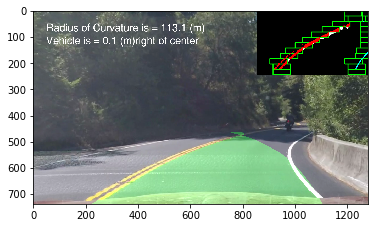

In [32]:
img = pipline_image(mpimg.imread('test_images/challenges/vlcsnap-4850-08-10-12h55m39s932.jpg'))
plt.imshow(img)

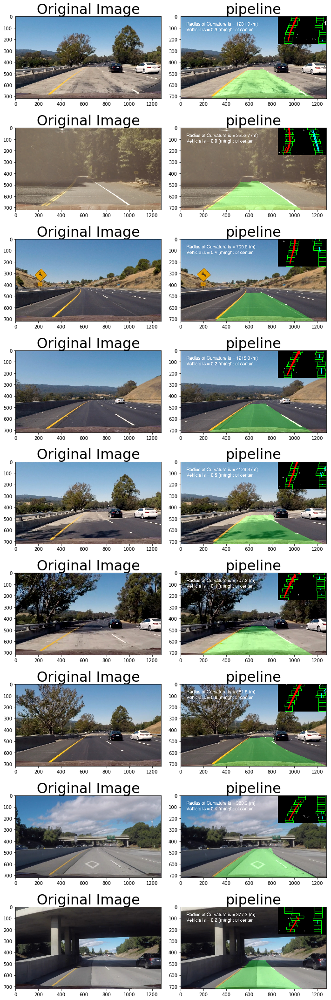

In [33]:
display_result('test_images/test*.jpg', pipline_image, "pipeline", 10, 30)

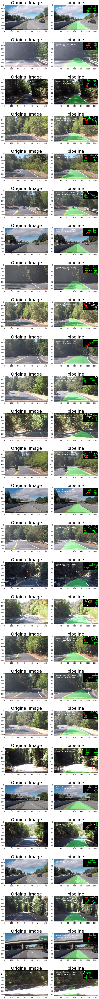

In [34]:
display_result('test_images/challenges/*.jpg', pipline_image, "pipeline", 10, 100)

### 7. Pipeline in VIDEO

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line:
    
    n_interations = 7 #n iterations
    reset = 5 # reset after 3 failed frames continouslly occur
    
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.array([0,0,0], dtype='float') #None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = 0 #None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = 0 #None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        #reset value to count up until blind search re-started
        self.reset_count = 0
        
        
    def update_line(self):
        self.recent_xfitted += [(self.allx, self.ally)]  
        self.recent_xfitted = self.recent_xfitted[-self.n_interations:] # last n fits of the line
        #get the unique coordinates over the last n iterations
        if (len(self.recent_xfitted)> 1):
            self.bestx = [np.hstack(c) for c in zip(*self.recent_xfitted)]
            self.best_fit = np.polyfit(self.bestx[1], self.bestx[0], 2)
        else: 
            self.bestx = self.recent_xfitted
            self.best_fit = np.polyfit(self.bestx[0][1], self.bestx[0][0], 2)
    
    def line_pos(self, img):
        head = self.current_fit[2]  
        bottom = (self.current_fit[0]*img.shape[0]**2 +\
                  self.current_fit[1]*img.shape[0] + self.current_fit[2])
        
        return [head, bottom]
    
    def diffs_check(self, new_fit):
        self.diffs = self.current_fit - new_fit
        self.diffs = np.absolute(self.diffs)
        if self.diffs[0] < 0.0001 and self.diffs[1] < 0.05 and self.diffs[2] < 50:
            self.current_fit = new_fit
            check_passed = True
        else: 
            self.detected = False
            check_passed  = False
        
        return check_passed
    
    def reset_countup(self):
        if self.reset_count < self.reset:
            if self.detected == False:
                self.reset_count += 1
                self.detected = True
        

In [ ]:
left_line, right_line = Line(),Line()
def sanity_check(binary_warped):
    """
    Sanity Check
        Check new lines make sense
        True: new lines passed, False: new lines failed
    """ 
    #sanity check: expected seperation, expected slope, expected curvature and final result
    sanity_seperation, sanity_slope, sanity_curvature, sanity_check = False, False, False, False 
    
    """expected separation""" 
    #Checking that they are separated by approximately the right distance horizontally
    #Checking that there are not intersecting somewhere
    separation = [x - y for x, y in zip(right_line.line_pos(binary_warped),\
                                        left_line.line_pos(binary_warped))] 
    if 100 < min(separation) and max(separation) < 1000:
        if max (left_line.allx) < min(right_line.allx):
            sanity_seperation = True
    
    """expected slope""" 
    # Checking that they are roughly parallel: when their slopes are similar
    # http://ci.columbia.edu/ci/premba_test/c0331/s4/s4_4.html 
    # f(y) = Ay^2 + By +C
    slope = (np.absolute(left_line.current_fit[0]), np.absolute(right_line.current_fit[0]))
    diffs_slope = np.absolute((slope[0] - slope[1])/((slope[0] + slope[1])))
    sign = (left_line.current_fit[0], right_line.current_fit[0])
    if not min(sign)< 0 < max(sign) or  diffs_slope < 0.5:
        sanity_slope = True
        
    """expected curvature""" 
    # new lines's curvature
    new_curvature_left, new_curvature_right = curvature_measure(binary_warped,\
                                                                left_line.allx, left_line.ally,\
                                                                right_line.allx, right_line.ally)
    
    #Checking that new lines have similar curvature
    diffs_curvature = np.absolute(new_curvature_left -\
                                  new_curvature_right)/(new_curvature_left +\
                                                        new_curvature_right)
    if diffs_curvature < 0.4 :
        sanity_curvature = True
    
    if sanity_seperation and sanity_slope and sanity_curvature :
        sanity_check = True
    
    else:
        sanity_check = False
        left_line.detected = False
        right_line.detected = False    
    
    return sanity_check

In [ ]:
def pipline_video(frame):
    
    distortion_correc  = undistored_camera.undistorted_image(frame)
    thresholding       = color_gradient(distortion_correc, combine = True)
    perspective_trans  = transformed_image.perspective_transform(thresholding)
    
    """
    Look-Ahead Filter
        Once lane lines found in one frame of video, do Sanity check
        If they are passed then search within a window around the previous detection.
    """
    update_status = False
    
    if left_line.detected is False and right_line.detected is False:
        left_line.allx, left_line.ally, right_line.allx, right_line.ally,\
        left_line.current_fit,right_line.current_fit, non_empty = histogram_sldwindows(perspective_trans)
        if non_empty :
            update_status = sanity_check(perspective_trans)
            if update_status:
                status = 'blind search passed!'
                left_line.reset_count, right_line.reset_count  = 0, 0 #reset value to count-up
        if non_empty is not True or update_status is not True:
            status = 'blind search failed! blind search again!'
            #force to blind search in next frame!
            left_line.detected = False
            right_line.detected = False
           
    else:
        left_line.allx, left_line.ally, right_line.allx, right_line.ally,\
        left_new_fit,right_new_fit = quickfind_lines(perspective_trans,\
                                                     left_line.current_fit,\
                                                     right_line.current_fit)
        #Checking that new lines have similar curvature vith previous ones
        if left_line.diffs_check(left_new_fit) and right_line.diffs_check(right_new_fit):
            update_status = True
            status = 'New lines dectection passed'
        else:
            update_status = False
            status = 'New lines dectection failed'
            # Count up reset value when failed search occured!
            left_line.reset_countup(), right_line.countup()
         
    
    """Update & Smoothing"""
    if update_status :
        left_line.update_line(), right_line.update_line()
        
        left_line.line_base_pos,\
        right_line.line_base_pos = offset_measure(perspective_trans,\
                                                  left_line.current_fit,\
                                                  right_line.current_fit)
        left_line.radius_of_curvature,\
        right_line.radius_of_curvature = curvature_measure(perspective_trans,\
                                                           left_line.allx, left_line.ally,\
                                                           right_line.allx, right_line.ally)
    """
    Reset
        Retain the previous positions from the frame prior and step to the next frame to search again
        at most 5 bad or difficult fames, then start searching from scratch
        After few bad frames, reset blind search if (left or right)line disappeard
    """
    
    if  left_line.reset_count == left_line.reset or right_line.reset_count == right_line.reset:
        left_line.detected = False
        right_line.detected = False
    
    #left_line_exist = min (left_line.best_fit) != 0 != max (left_line.best_fit)
    #right_line_exist = min (right_line.best_fit) != 0 != max (right_line.best_fit)
    #if not left_line.best_fit or not right_line.best_fit:
    #    left_line.detected = False
    #    right_line.detected = False
    
                                    
    """
    Calculate curvature & offset 
    """
    curvature = (right_line.radius_of_curvature + left_line.radius_of_curvature)*0.5
    offset = np.absolute((right_line.line_base_pos + left_line.line_base_pos)*0.5)
    if right_line.line_base_pos > left_line.line_base_pos:
        position = 'right'
    elif right_line.line_base_pos == left_line.line_base_pos:
        position = '' 
    else:  position = 'left'
    
    """
    Output
        Draw pipeline (To obatain a cleaner result, use avaraged coefficients self.best_fit)
        Write curvature & offset
    """ 
    pipelines = drawing(perspective_trans, left_line.best_fit, right_line.best_fit,\
                            frame, distortion_correc, transformed_image.dst, transformed_image.src)
    write_curvature = writing(pipelines,'Radius of Curvature is = ' +\
                              str(round(curvature, 1))+' (m)',(50, 50))
    write_offset = writing(write_curvature,'Vehicle is = ' + str(round(offset, 1))+ ' (m)'+\
                           position+' of center', (50, 100))
    write_status = writing(write_offset, status, (50, 150))
    
    return write_status

In [ ]:
left_line, right_line = Line(),Line()
img = pipline_video(mpimg.imread('test_images/challenges/vlcsnap-7438-01-29-06h45m45s463.jpg'))
plt.imshow(img)

In [ ]:
# Create video
def process_video(input_dir, output_name, action, start = 0, end = 50):
    input_video = VideoFileClip(input_dir).subclip(start, end)
    output_video = input_video.fl_image(action)
    %time output_video.write_videofile(output_name + "_processed.mp4", audio=False)

Project Video

In [ ]:
left_line, right_line = Line(),Line()
process_video("./project_video.mp4", "project_video", pipline_video, start = 0, end = 50)

Challenge Video

In [ ]:
left_line, right_line = Line(),Line()
process_video("./challenge_video.mp4", "challenge_video", pipline_video, start = 0, end = 16)#16

Harder Challenge Video

In [ ]:
left_line, right_line = Line(),Line()
process_video("./harder_challenge_video.mp4", "harder_challenge_video", pipline_video, start = 0, end = 47)

In [ ]:
%matplotlib notebook

import matplotlib.pyplot as plt

y = np.arange(700)
if (left_line.best_fit) is  None:
    print(right_line.radius_of_curvature)

#left =  left_line.best_fit[0]*y**2 +  left_line.best_fit[1]*y + left_line.best_fit[2]
left  = (right_line.best_fit[0])*y**2 +  (right_line.best_fit[1])*y + right_line.best_fit[2]
right = right_line.best_fit[0]*y**2 +  (right_line.best_fit[1])*y + right_line.best_fit[2]-100

plt.figure()
plt.ylim(720, 0)
plt.xlim(0, 1300)
plt.plot(left,y, label='data1')
plt.plot(right,y, label='data2')